# Completing Image with Random Missing Data: Apply RFF to complete the image with 10%, 20%, and so on up to 90% of its data missing randomly. Randomly remove portions of the data, train the model on the remaining data, and predict on the entire image. Display the reconstructed images for each missing data percentage and show the metrics calculated above. What do you conclude?. [2 Marks]

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [2]:
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

dog.jpg exists


In [3]:
device

device(type='cuda')

In [4]:
img = torchvision.io.read_image("dog.jpg")
img.shape

torch.Size([3, 1365, 2048])

In [5]:
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))


In [6]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled = torch.tensor(img_scaled)

In [7]:
img_scaled = img_scaled.to(device)
img_scaled

tensor([[[0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3765, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3804, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3843, 0.3804, 0.3804]],

        [[0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         ...,
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3176, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3216, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3255, 0.3216, 0.3216]],

        [[0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.

In [8]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 300, 300)
crop.shape

torch.Size([3, 300, 300])

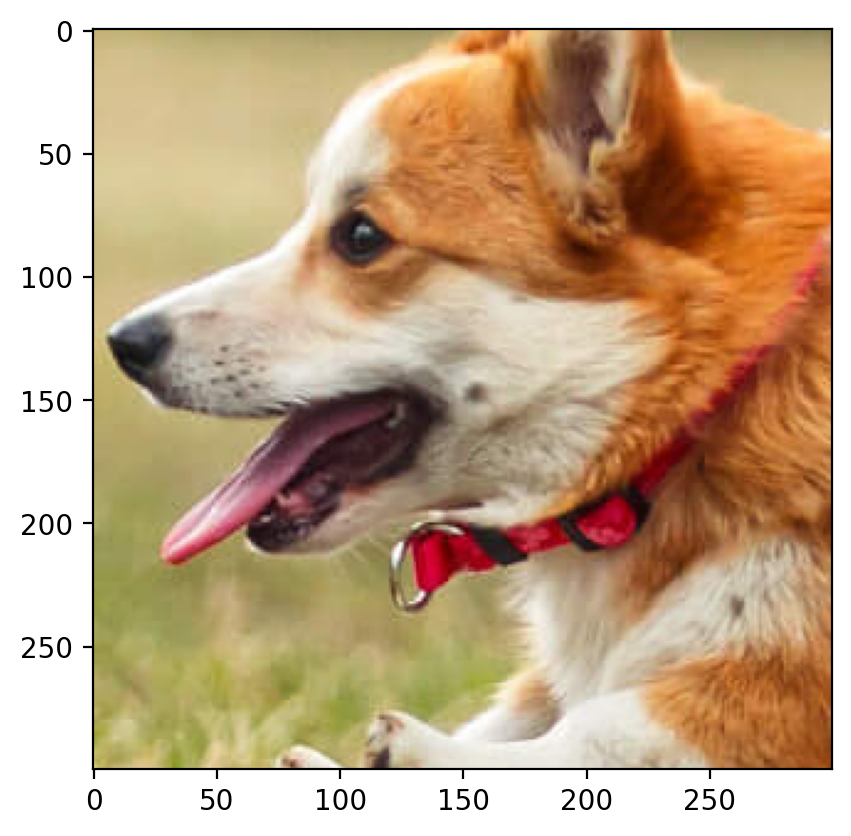

In [9]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())

In [10]:
crop = crop.to(device)


In [11]:
# Get the dimensions of the image tensor
num_channels, height, width = crop.shape
print(num_channels, height, width)

3 300 300


In [12]:
def create_coordinate_map(img):
    """
    img: torch.Tensor of shape (num_channels, height, width)

    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """

    num_channels, height, width = img.shape

    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

In [13]:
dog_X, dog_Y = create_coordinate_map(crop)

dog_X.shape, dog_Y.shape

(torch.Size([90000, 2]), torch.Size([90000, 3]))

In [14]:
# MinMaxScaler from -1 to 1
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()

In [15]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x):
        return self.linear(x)


In [16]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)


        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    return loss.item()

In [17]:
def create_rff_features2(X, num_features, sigma, device):
    from sklearn.kernel_approximation import RBFSampler
    import numpy as np

    X_np = X.cpu().numpy()
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2), random_state=42)
    X_rff = rff.fit_transform(X_np)
    X_tensor = torch.tensor(X_rff, dtype=torch.float32, device=device)

    return X_tensor

In [18]:
def plot_reconstructed_and_original_image(original_img, net, X, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """

    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)

    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.cpu())
    ax0.set_title("Reconstructed Image")


    ax1.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Original Image")

    for a in [ax0, ax1]:
        a.axis("off")


    fig.suptitle(title, y=0.9)
    plt.tight_layout()
    return outputs

In [19]:
X_rff = create_rff_features2(dog_X_scaled, 15000, 0.008, device)

In [20]:
print(X_rff.shape)
print(dog_Y.shape)

torch.Size([90000, 15000])
torch.Size([90000, 3])


## Now we are creating a function that given an percentage randomly remove that percentage of data

In [21]:
import random

def create_boolean_list(N, X):
    """
    Create a boolean list of size N where X percentage of random elements are False.

    Args:
    - N (int): Size of the boolean list.
    - X (float): Percentage of elements that should be False (0.0 to 100.0).

    Returns:
    - list: Boolean list with X percentage of random elements set to False.
    """
    # Calculate the number of False elements
    num_false = int(N * (X / 100))

    # Create a list with all elements set to True
    boolean_list = [True] * N

    # Randomly select indices to set to False
    false_indices = random.sample(range(N), num_false)

    # Set selected indices to False
    for idx in false_indices:
        boolean_list[idx] = False

    return np.array(boolean_list)


In [22]:
def Show_removed_pixel(img , indices):

  num_channels, height, width = img.shape
  img_new = img.clone()
  img_new = rearrange(img_new , 'c h w -> (h w) c')
  img_new[(indices == False).tolist(), :] = float('nan')
  plt.imshow(img_new.reshape(height , width , num_channels).cpu().numpy())
  return img_new.reshape(height , width , num_channels)


# Removing 10 percentage of Pixels

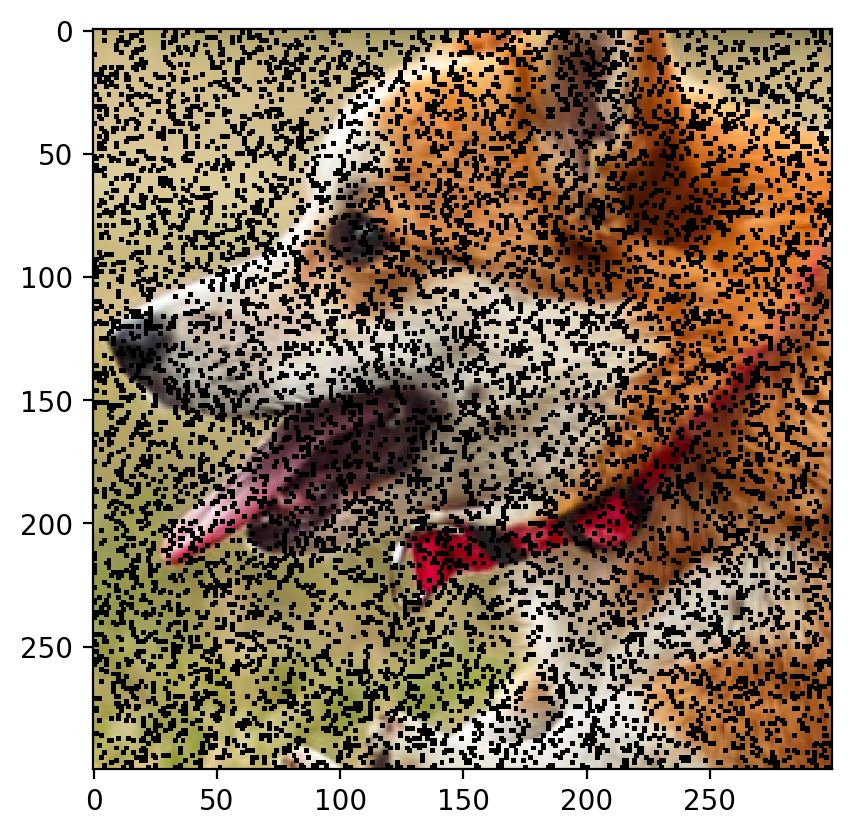

In [23]:
Findices = create_boolean_list(dog_Y.shape[0],10)
new_crop_10 = Show_removed_pixel(crop, Findices)

# Now we are going to train with 90 % of image.

In [24]:
dog_Y_10 = dog_Y[Findices , :]
X_rff_10 = X_rff[Findices , :]
print(dog_Y_10.shape)
print(X_rff_10.shape)

torch.Size([81000, 3])
torch.Size([81000, 15000])


In [25]:
model = LinearModel(X_rff_10.shape[1], dog_Y_10.shape[1])

model.to(device)

train(model, 0.005, X_rff_10, dog_Y_10, 2000)

Epoch 0 loss: 0.377205
Epoch 100 loss: 0.054536
Epoch 200 loss: 0.016532
Epoch 300 loss: 0.010783
Epoch 400 loss: 0.007964
Epoch 500 loss: 0.006033
Epoch 600 loss: 0.004656
Epoch 700 loss: 0.003659
Epoch 800 loss: 0.002930
Epoch 900 loss: 0.002393
Epoch 1000 loss: 0.001993
Epoch 1100 loss: 0.001694
Epoch 1200 loss: 0.001467
Epoch 1300 loss: 0.001293
Epoch 1400 loss: 0.001158
Epoch 1500 loss: 0.001052
Epoch 1600 loss: 0.000967
Epoch 1700 loss: 0.000899
Epoch 1800 loss: 0.000842
Epoch 1900 loss: 0.000795


0.000755676010157913

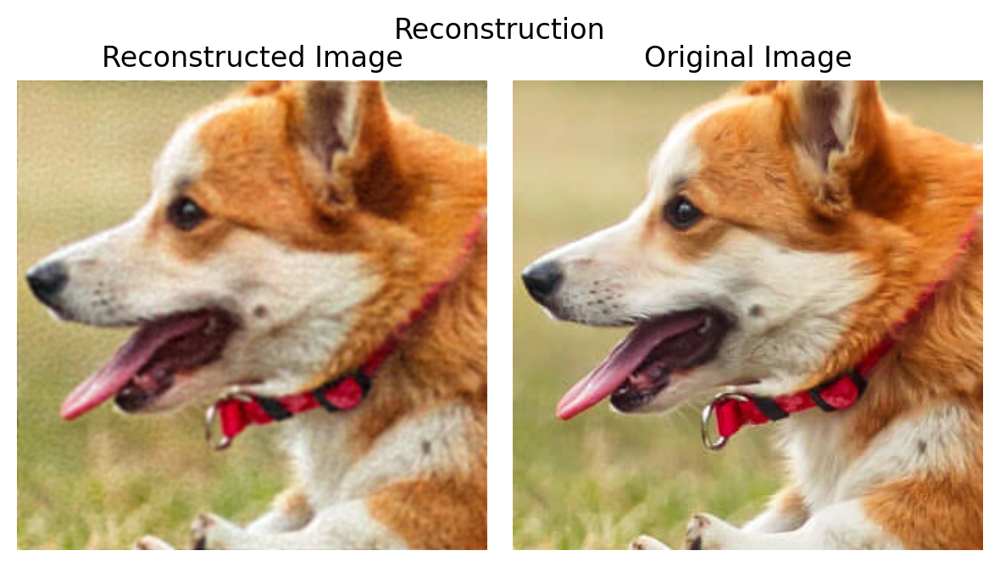

In [26]:
output_y_10 =plot_reconstructed_and_original_image(crop , model ,X_rff ,title="Reconstruction" )

In [27]:
rmse_loss =[]
peak_snr = []

# Calculating RMSE and Peak SNR

In [28]:
mse = ((output_y_10.cpu().numpy() - rearrange(crop , 'c h w -> h w c').cpu().numpy())**2).sum() / (crop.shape[0]* crop.shape[1]* crop.shape[2])

rmse = np.sqrt(mse)
rmse

MAX=1.0 # MAX represents the maximum possible pixel value of the image (e.g., 255 for an 8-bit grayscale image or 1 for a normalized image).

PSNR = 10 * np.log10((MAX ** 2) / mse)

print('RMSE:', rmse)
print('Peak SNR:' , PSNR)
rmse_loss.append(rmse)
peak_snr.append(PSNR)


RMSE: 0.02820399253973446
Peak SNR: 30.993788177412732


In [29]:
del X_rff_10
torch.cuda.empty_cache()

In [30]:
torch.cuda.empty_cache()

# With 20% pixel removal

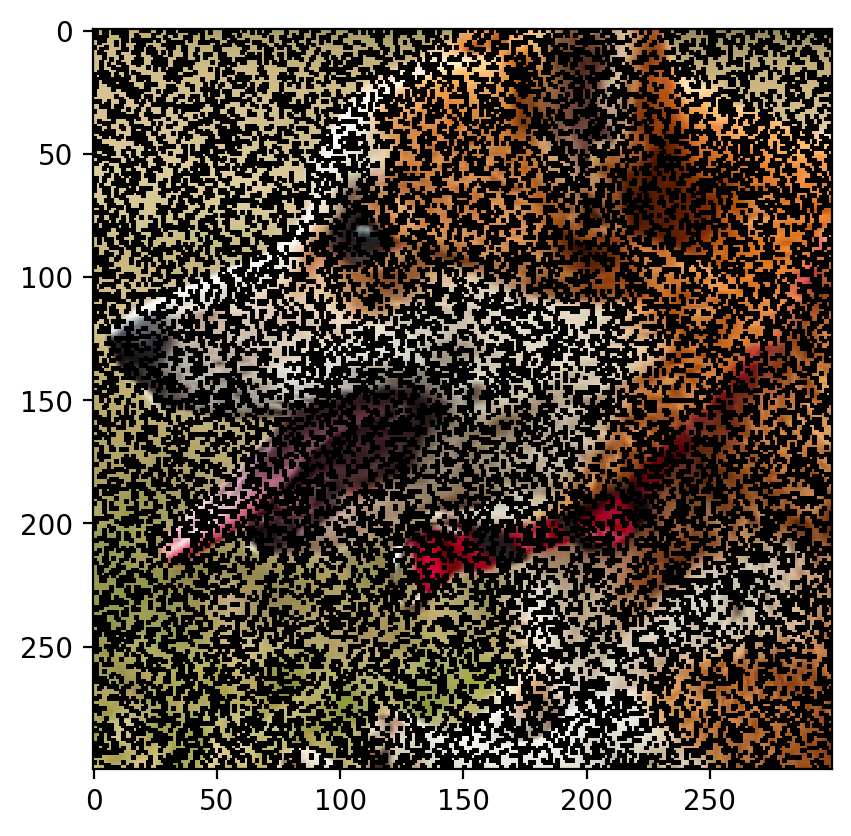

In [31]:
Findices = create_boolean_list(dog_Y.shape[0],20)
new_crop_20 = Show_removed_pixel(crop, Findices)

In [32]:
dog_Y_20 = dog_Y[Findices , :]
X_rff_20 = X_rff[Findices , :]
print(dog_Y_20.shape)
print(X_rff_20.shape)

torch.Size([72000, 3])
torch.Size([72000, 15000])


In [33]:
model = LinearModel(X_rff_20.shape[1], dog_Y_20.shape[1])

model.to(device)

train(model, 0.005, X_rff_20, dog_Y_20, 2000)

Epoch 0 loss: 0.370772
Epoch 100 loss: 0.052739
Epoch 200 loss: 0.016200
Epoch 300 loss: 0.010565
Epoch 400 loss: 0.007811
Epoch 500 loss: 0.005926
Epoch 600 loss: 0.004581
Epoch 700 loss: 0.003605
Epoch 800 loss: 0.002891
Epoch 900 loss: 0.002363
Epoch 1000 loss: 0.001970
Epoch 1100 loss: 0.001674
Epoch 1200 loss: 0.001449
Epoch 1300 loss: 0.001276
Epoch 1400 loss: 0.001141
Epoch 1500 loss: 0.001035
Epoch 1600 loss: 0.000950
Epoch 1700 loss: 0.000881
Epoch 1800 loss: 0.000824
Epoch 1900 loss: 0.000777


0.000738111324608326

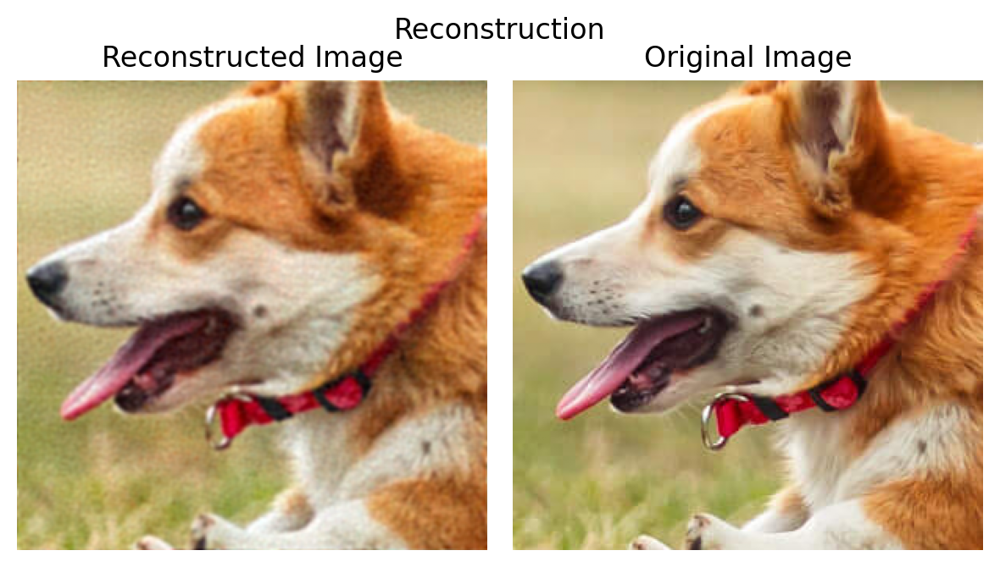

In [34]:
output_y_20 =plot_reconstructed_and_original_image(crop , model ,X_rff ,title="Reconstruction" )

In [35]:
mse = ((output_y_20.cpu().numpy() - rearrange(crop , 'c h w -> h w c').cpu().numpy())**2).sum() / (crop.shape[0]* crop.shape[1]* crop.shape[2])

rmse = np.sqrt(mse)
rmse

MAX=1.0 # MAX represents the maximum possible pixel value of the image (e.g., 255 for an 8-bit grayscale image or 1 for a normalized image).

PSNR = 10 * np.log10((MAX ** 2) / mse)

print('RMSE:', rmse)
print('Peak SNR:' , PSNR)
rmse_loss.append(rmse)
peak_snr.append(PSNR)


RMSE: 0.02876452380195928
Peak SNR: 30.822856226889748


In [36]:
del X_rff_20

In [37]:
torch.cuda.empty_cache()

## For 30%

torch.Size([63000, 3])
torch.Size([63000, 15000])
Epoch 0 loss: 0.367370
Epoch 100 loss: 0.051368
Epoch 200 loss: 0.016065
Epoch 300 loss: 0.010410
Epoch 400 loss: 0.007689
Epoch 500 loss: 0.005837
Epoch 600 loss: 0.004516
Epoch 700 loss: 0.003559
Epoch 800 loss: 0.002857
Epoch 900 loss: 0.002337
Epoch 1000 loss: 0.001949
Epoch 1100 loss: 0.001657
Epoch 1200 loss: 0.001435
Epoch 1300 loss: 0.001263
Epoch 1400 loss: 0.001130
Epoch 1500 loss: 0.001025
Epoch 1600 loss: 0.000940
Epoch 1700 loss: 0.000872
Epoch 1800 loss: 0.000816
Epoch 1900 loss: 0.000769


RMSE: 0.02979381020859817
Peak SNR: 30.51747906174491


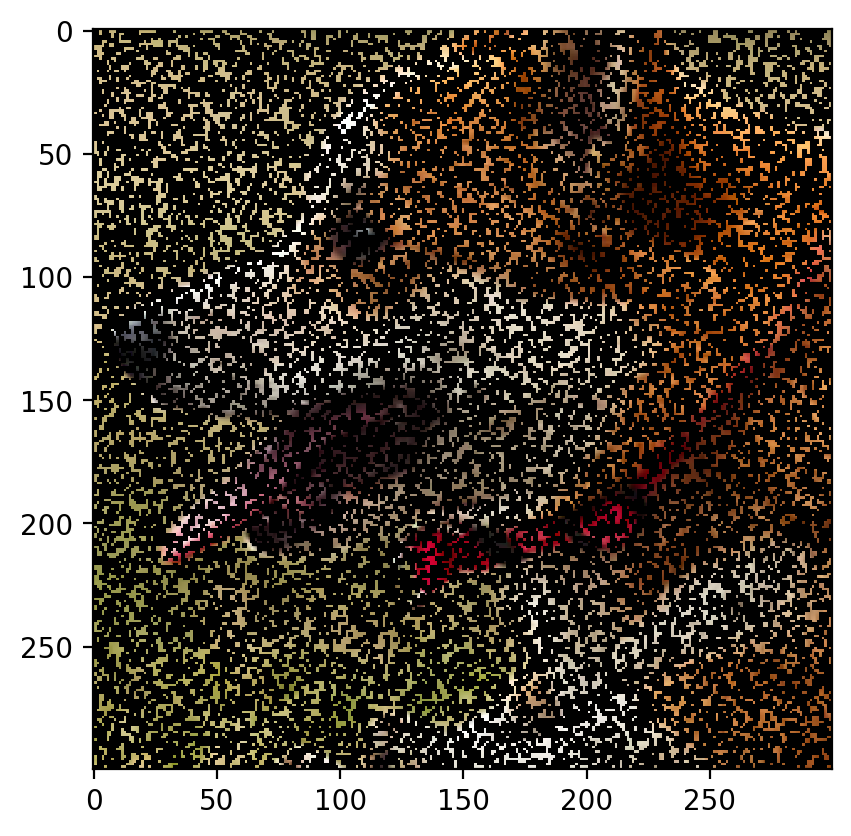

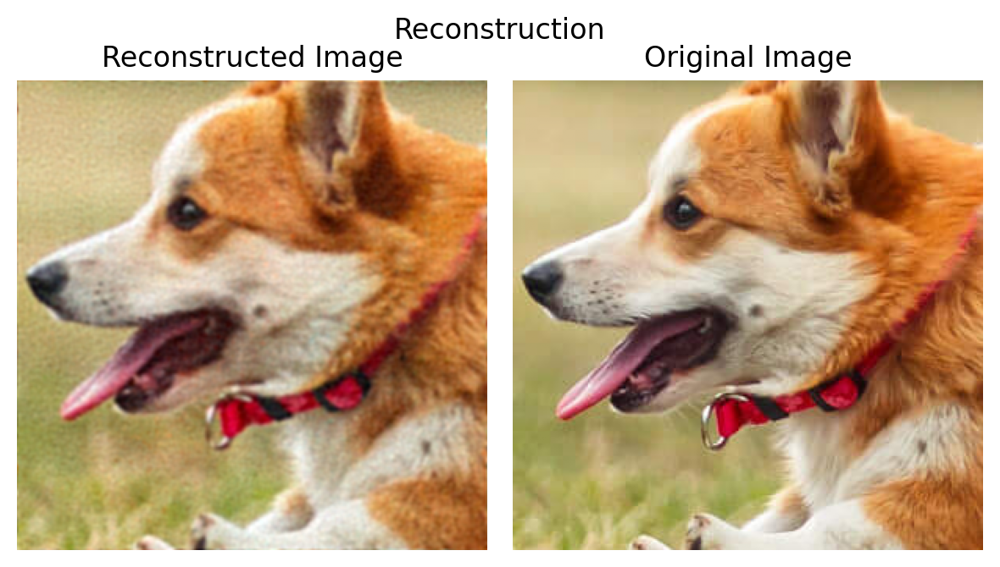

In [38]:
Findices = create_boolean_list(dog_Y.shape[0],30)
new_crop_30 = Show_removed_pixel(crop, Findices)

dog_Y_30 = dog_Y[Findices , :]
X_rff_30 = X_rff[Findices , :]
print(dog_Y_30.shape)
print(X_rff_30.shape)


model = LinearModel(X_rff_30.shape[1], dog_Y_30.shape[1])

model.to(device)

train(model, 0.005, X_rff_30, dog_Y_30, 2000)

output_y_30 =plot_reconstructed_and_original_image(crop , model ,X_rff ,title="Reconstruction" )


mse = ((output_y_30.cpu().numpy() - rearrange(crop , 'c h w -> h w c').cpu().numpy())**2).sum() / (crop.shape[0]* crop.shape[1]* crop.shape[2])

rmse = np.sqrt(mse)
rmse

MAX=1.0 # MAX represents the maximum possible pixel value of the image (e.g., 255 for an 8-bit grayscale image or 1 for a normalized image).

PSNR = 10 * np.log10((MAX ** 2) / mse)

print('RMSE:', rmse)
print('Peak SNR:' , PSNR)
rmse_loss.append(rmse)
peak_snr.append(PSNR)


In [39]:
del X_rff_30

In [40]:
torch.cuda.empty_cache()

# For 40% Pixel reduction

torch.Size([54000, 3])
torch.Size([54000, 15000])
Epoch 0 loss: 0.367547
Epoch 100 loss: 0.049934
Epoch 200 loss: 0.015693
Epoch 300 loss: 0.010069
Epoch 400 loss: 0.007446
Epoch 500 loss: 0.005675
Epoch 600 loss: 0.004408
Epoch 700 loss: 0.003485
Epoch 800 loss: 0.002805
Epoch 900 loss: 0.002300
Epoch 1000 loss: 0.001921
Epoch 1100 loss: 0.001634
Epoch 1200 loss: 0.001415
Epoch 1300 loss: 0.001246
Epoch 1400 loss: 0.001114
Epoch 1500 loss: 0.001010
Epoch 1600 loss: 0.000926
Epoch 1700 loss: 0.000858
Epoch 1800 loss: 0.000801
Epoch 1900 loss: 0.000755


RMSE: 0.031318286259489764
Peak SNR: 30.084040212237095


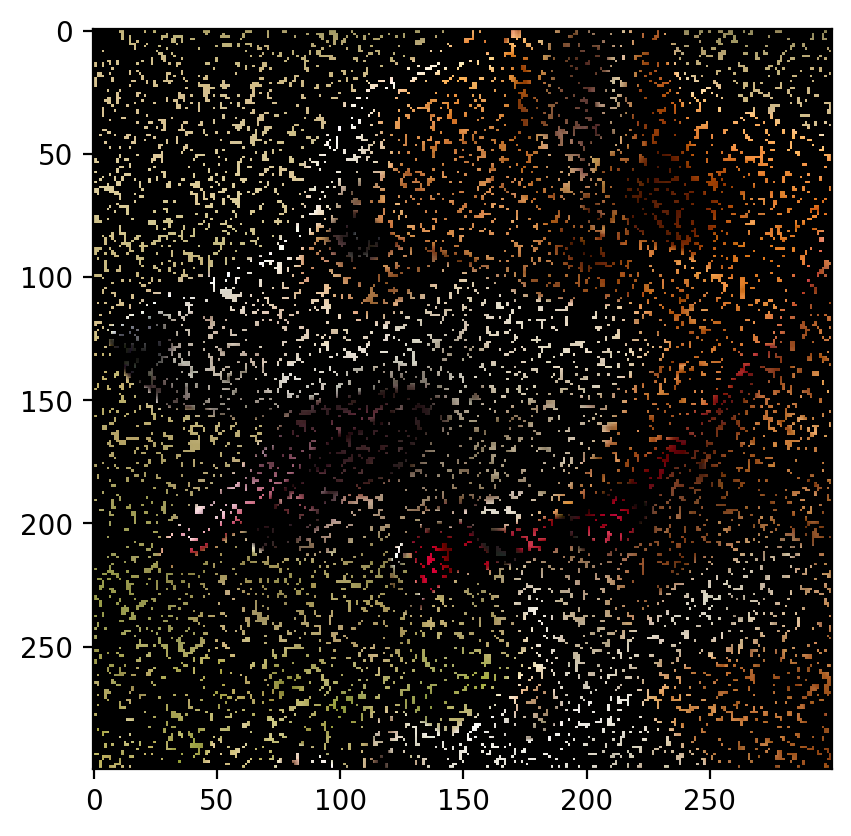

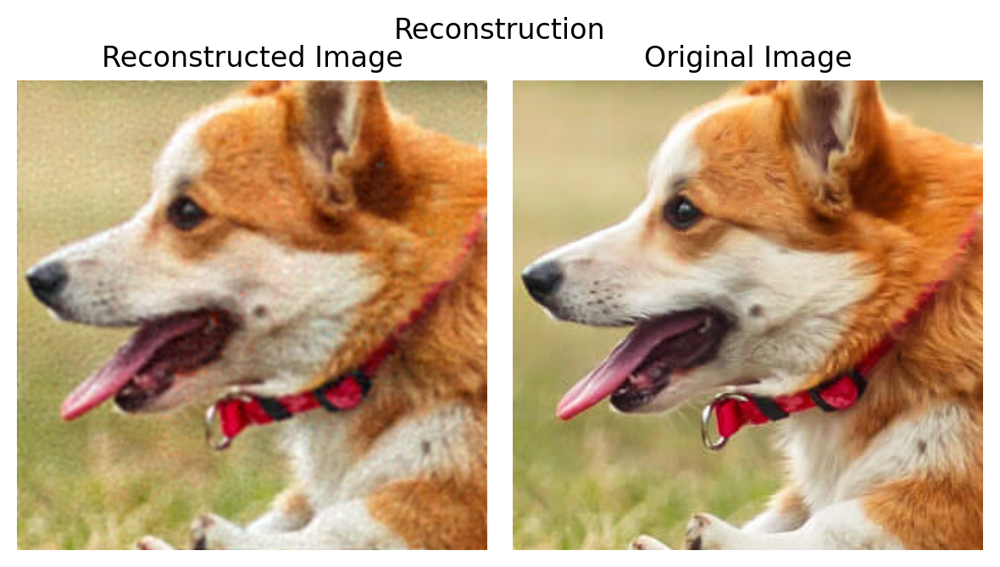

In [41]:
Findices = create_boolean_list(dog_Y.shape[0],40)
new_crop_40 = Show_removed_pixel(crop, Findices)

dog_Y_40 = dog_Y[Findices , :]
X_rff_40 = X_rff[Findices , :]
print(dog_Y_40.shape)
print(X_rff_40.shape)


model = LinearModel(X_rff_40.shape[1], dog_Y_40.shape[1])

model.to(device)

train(model, 0.005, X_rff_40, dog_Y_40, 2000)

output_y_40 =plot_reconstructed_and_original_image(crop , model ,X_rff ,title="Reconstruction" )


mse = ((output_y_40.cpu().numpy() - rearrange(crop , 'c h w -> h w c').cpu().numpy())**2).sum() / (crop.shape[0]* crop.shape[1]* crop.shape[2])

rmse = np.sqrt(mse)
rmse

MAX=1.0 # MAX represents the maximum possible pixel value of the image (e.g., 255 for an 8-bit grayscale image or 1 for a normalized image).

PSNR = 10 * np.log10((MAX ** 2) / mse)

print('RMSE:', rmse)
print('Peak SNR:' , PSNR)
rmse_loss.append(rmse)
peak_snr.append(PSNR)

In [42]:
del X_rff_40

In [43]:
torch.cuda.empty_cache()

# For 50% Pixel reduction

torch.Size([45000, 3])
torch.Size([45000, 15000])
Epoch 0 loss: 0.371726
Epoch 100 loss: 0.049506
Epoch 200 loss: 0.015645
Epoch 300 loss: 0.009725
Epoch 400 loss: 0.007128
Epoch 500 loss: 0.005430
Epoch 600 loss: 0.004224
Epoch 700 loss: 0.003346
Epoch 800 loss: 0.002698
Epoch 900 loss: 0.002214
Epoch 1000 loss: 0.001850
Epoch 1100 loss: 0.001574
Epoch 1200 loss: 0.001361
Epoch 1300 loss: 0.001196
Epoch 1400 loss: 0.001067
Epoch 1500 loss: 0.000964
Epoch 1600 loss: 0.000881
Epoch 1700 loss: 0.000814
Epoch 1800 loss: 0.000759
Epoch 1900 loss: 0.000712


RMSE: 0.03418529858192208
Peak SNR: 29.323212450475673


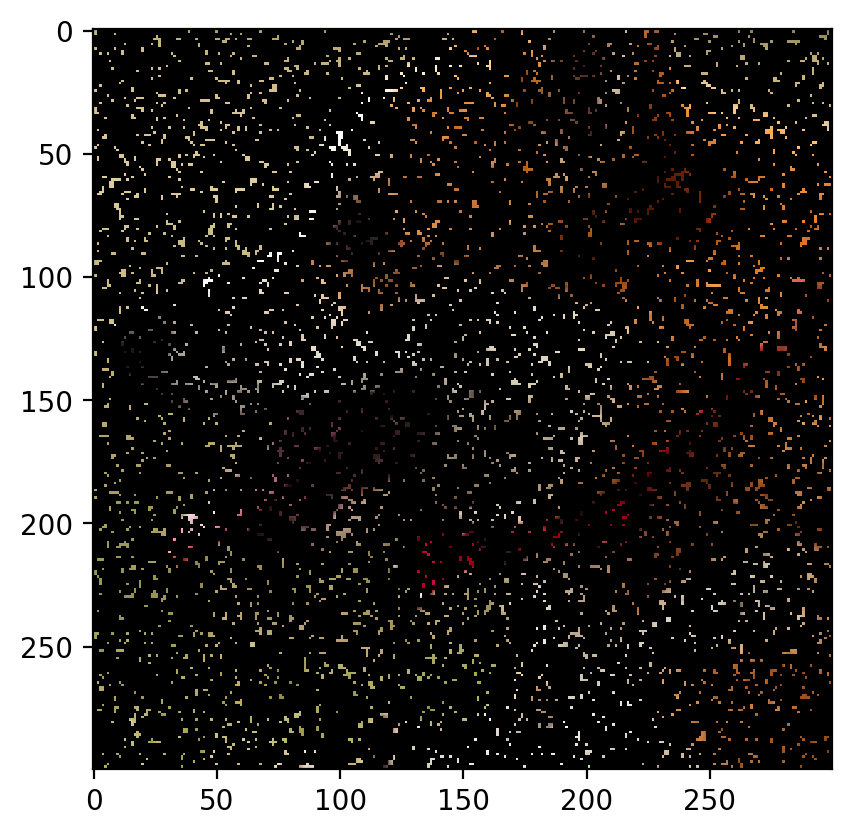

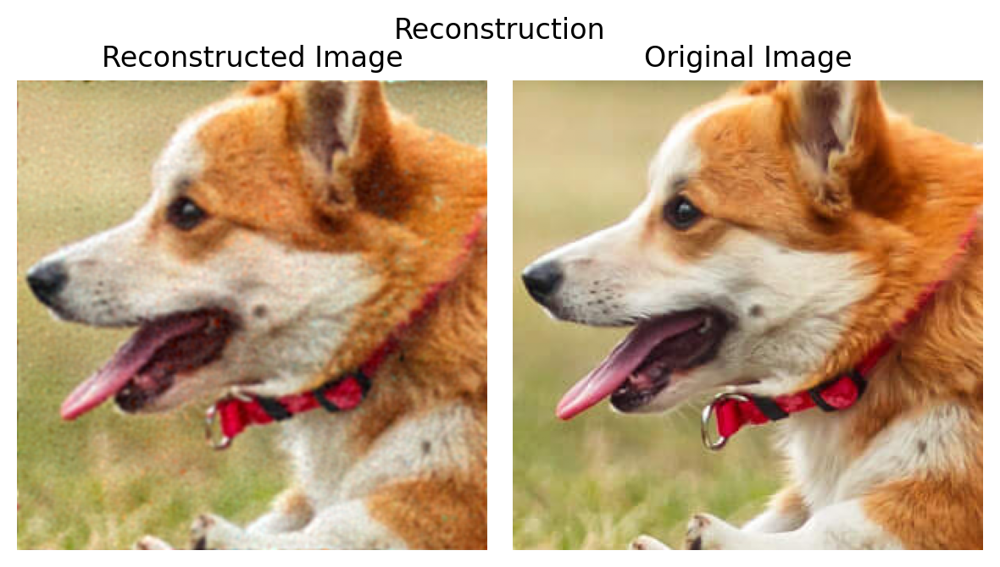

In [44]:
Findices = create_boolean_list(dog_Y.shape[0],50)
new_crop_50 = Show_removed_pixel(crop, Findices)

dog_Y_50 = dog_Y[Findices , :]
X_rff_50 = X_rff[Findices , :]
print(dog_Y_50.shape)
print(X_rff_50.shape)


model = LinearModel(X_rff_50.shape[1], dog_Y_50.shape[1])

model.to(device)

train(model, 0.005, X_rff_50, dog_Y_50, 2000)

output_y_50 =plot_reconstructed_and_original_image(crop , model ,X_rff ,title="Reconstruction" )


mse = ((output_y_50.cpu().numpy() - rearrange(crop , 'c h w -> h w c').cpu().numpy())**2).sum() / (crop.shape[0]* crop.shape[1]* crop.shape[2])

rmse = np.sqrt(mse)
rmse

MAX=1.0 # MAX represents the maximum possible pixel value of the image (e.g., 255 for an 8-bit grayscale image or 1 for a normalized image).

PSNR = 10 * np.log10((MAX ** 2) / mse)

print('RMSE:', rmse)
print('Peak SNR:' , PSNR)
rmse_loss.append(rmse)
peak_snr.append(PSNR)

In [45]:
del X_rff_50

In [46]:
torch.cuda.empty_cache()

# For 60% Pixel Reduction

torch.Size([36000, 3])
torch.Size([36000, 15000])
Epoch 0 loss: 0.372600
Epoch 100 loss: 0.046813
Epoch 200 loss: 0.015253
Epoch 300 loss: 0.009251
Epoch 400 loss: 0.006710
Epoch 500 loss: 0.005132
Epoch 600 loss: 0.004028
Epoch 700 loss: 0.003222
Epoch 800 loss: 0.002621
Epoch 900 loss: 0.002166
Epoch 1000 loss: 0.001818
Epoch 1100 loss: 0.001550
Epoch 1200 loss: 0.001340
Epoch 1300 loss: 0.001174
Epoch 1400 loss: 0.001043
Epoch 1500 loss: 0.000938
Epoch 1600 loss: 0.000852
Epoch 1700 loss: 0.000783
Epoch 1800 loss: 0.000726
Epoch 1900 loss: 0.000678


RMSE: 0.03924340876494831
Peak SNR: 28.124665518446456


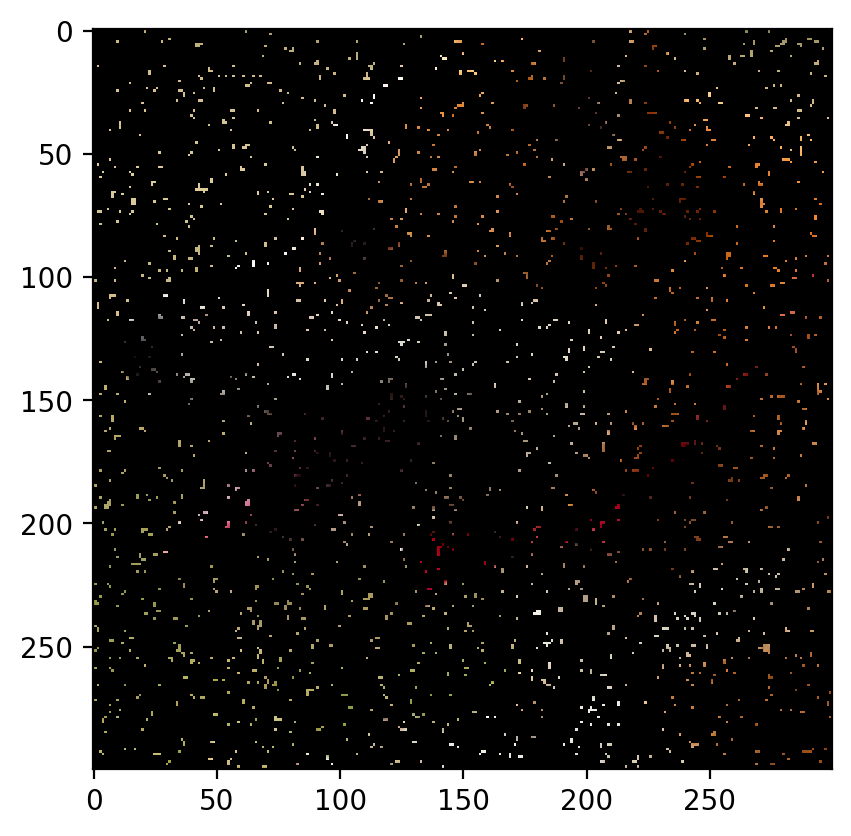

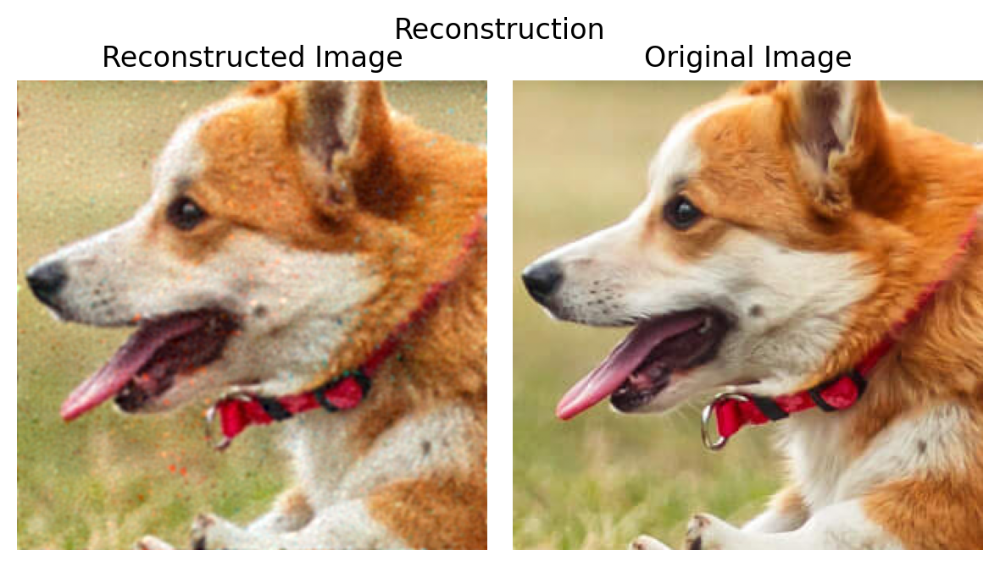

In [47]:
Findices = create_boolean_list(dog_Y.shape[0],60)
new_crop_60 = Show_removed_pixel(crop, Findices)

dog_Y_60 = dog_Y[Findices , :]
X_rff_60 = X_rff[Findices , :]
print(dog_Y_60.shape)
print(X_rff_60.shape)


model = LinearModel(X_rff_60.shape[1], dog_Y_60.shape[1])

model.to(device)

train(model, 0.005, X_rff_60, dog_Y_60, 2000)

output_y_60 =plot_reconstructed_and_original_image(crop , model ,X_rff ,title="Reconstruction" )


mse = ((output_y_60.cpu().numpy() - rearrange(crop , 'c h w -> h w c').cpu().numpy())**2).sum() / (crop.shape[0]* crop.shape[1]* crop.shape[2])

rmse = np.sqrt(mse)
rmse

MAX=1.0 # MAX represents the maximum possible pixel value of the image (e.g., 255 for an 8-bit grayscale image or 1 for a normalized image).

PSNR = 10 * np.log10((MAX ** 2) / mse)

print('RMSE:', rmse)
print('Peak SNR:' , PSNR)
rmse_loss.append(rmse)
peak_snr.append(PSNR)

In [48]:
del X_rff_60

In [49]:
torch.cuda.empty_cache()

# For 70% Pixel reduction

torch.Size([27001, 3])
torch.Size([27001, 15000])
Epoch 0 loss: 0.373199
Epoch 100 loss: 0.042183
Epoch 200 loss: 0.014031
Epoch 300 loss: 0.008395
Epoch 400 loss: 0.006021
Epoch 500 loss: 0.004611
Epoch 600 loss: 0.003646
Epoch 700 loss: 0.002942
Epoch 800 loss: 0.002412
Epoch 900 loss: 0.002006
Epoch 1000 loss: 0.001691
Epoch 1100 loss: 0.001445
Epoch 1200 loss: 0.001250
Epoch 1300 loss: 0.001096
Epoch 1400 loss: 0.000971
Epoch 1500 loss: 0.000870
Epoch 1600 loss: 0.000788
Epoch 1700 loss: 0.000720
Epoch 1800 loss: 0.000664
Epoch 1900 loss: 0.000617


RMSE: 0.0533899480229686
Peak SNR: 25.45081003886314


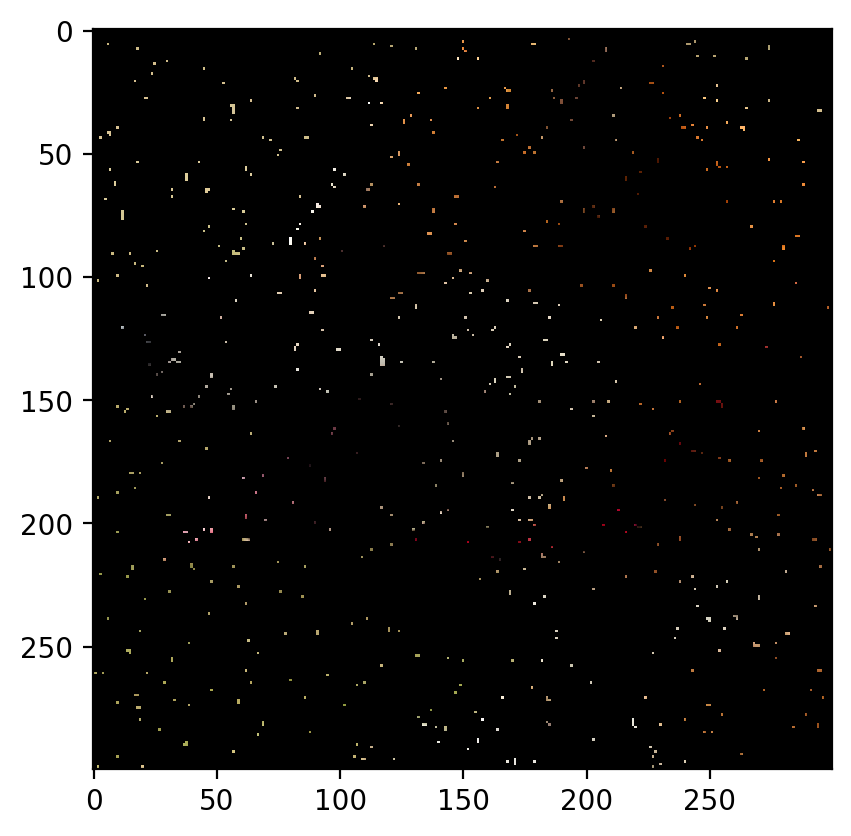

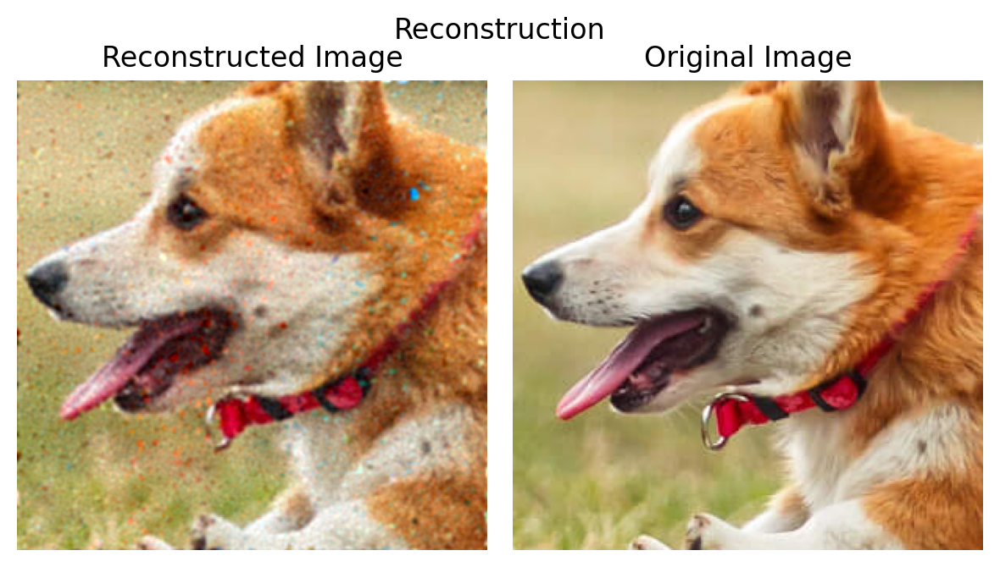

In [50]:
Findices = create_boolean_list(dog_Y.shape[0],70)
new_crop_70 = Show_removed_pixel(crop, Findices)

dog_Y_70 = dog_Y[Findices , :]
X_rff_70 = X_rff[Findices , :]
print(dog_Y_70.shape)
print(X_rff_70.shape)


model = LinearModel(X_rff_70.shape[1], dog_Y_70.shape[1])

model.to(device)

train(model, 0.005, X_rff_70, dog_Y_70, 2000)

output_y_70 =plot_reconstructed_and_original_image(crop , model ,X_rff ,title="Reconstruction" )


mse = ((output_y_70.cpu().numpy() - rearrange(crop , 'c h w -> h w c').cpu().numpy())**2).sum() / (crop.shape[0]* crop.shape[1]* crop.shape[2])

rmse = np.sqrt(mse)
rmse

MAX=1.0 # MAX represents the maximum possible pixel value of the image (e.g., 255 for an 8-bit grayscale image or 1 for a normalized image).

PSNR = 10 * np.log10((MAX ** 2) / mse)

print('RMSE:', rmse)
print('Peak SNR:' , PSNR)
rmse_loss.append(rmse)
peak_snr.append(PSNR)

In [51]:
del X_rff_70

In [52]:
torch.cuda.empty_cache()

# For 80% Pixel reduction

torch.Size([18000, 3])
torch.Size([18000, 15000])
Epoch 0 loss: 0.370655
Epoch 100 loss: 0.032616
Epoch 200 loss: 0.010381
Epoch 300 loss: 0.005952
Epoch 400 loss: 0.004109
Epoch 500 loss: 0.003087
Epoch 600 loss: 0.002433
Epoch 700 loss: 0.001980
Epoch 800 loss: 0.001649
Epoch 900 loss: 0.001397
Epoch 1000 loss: 0.001201
Epoch 1100 loss: 0.001045
Epoch 1200 loss: 0.000919
Epoch 1300 loss: 0.000816
Epoch 1400 loss: 0.000729
Epoch 1500 loss: 0.000657
Epoch 1600 loss: 0.000596
Epoch 1700 loss: 0.000543
Epoch 1800 loss: 0.000498
Epoch 1900 loss: 0.000459


RMSE: 0.12015792891295363
Peak SNR: 18.40495131875344


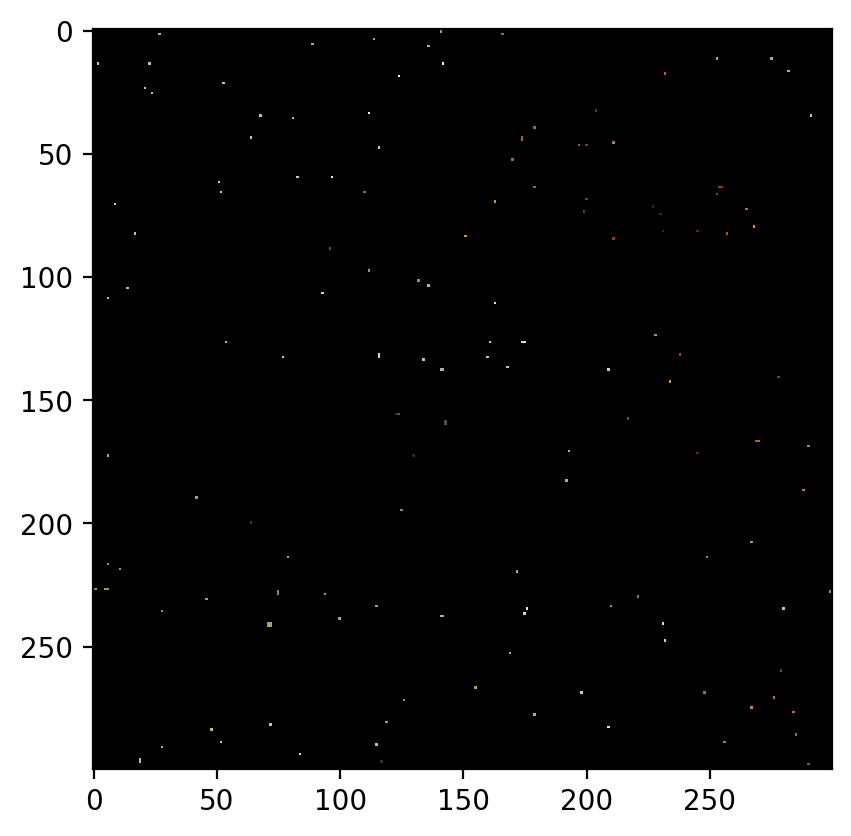

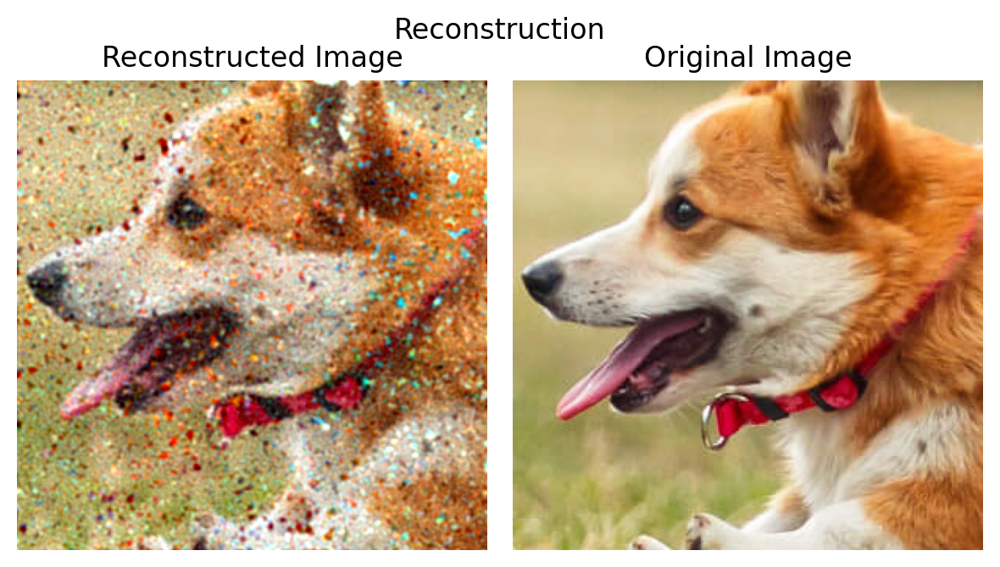

In [53]:
Findices = create_boolean_list(dog_Y.shape[0],80)
new_crop_80 = Show_removed_pixel(crop, Findices)

dog_Y_80 = dog_Y[Findices , :]
X_rff_80 = X_rff[Findices , :]
print(dog_Y_80.shape)
print(X_rff_80.shape)


model = LinearModel(X_rff_80.shape[1], dog_Y_80.shape[1])

model.to(device)

train(model, 0.005, X_rff_80, dog_Y_80, 2000)

output_y_80 =plot_reconstructed_and_original_image(crop , model ,X_rff ,title="Reconstruction" )


mse = ((output_y_80.cpu().numpy() - rearrange(crop , 'c h w -> h w c').cpu().numpy())**2).sum() / (crop.shape[0]* crop.shape[1]* crop.shape[2])

rmse = np.sqrt(mse)
rmse

MAX=1.0 # MAX represents the maximum possible pixel value of the image (e.g., 255 for an 8-bit grayscale image or 1 for a normalized image).

PSNR = 10 * np.log10((MAX ** 2) / mse)

print('RMSE:', rmse)
print('Peak SNR:' , PSNR)
rmse_loss.append(rmse)
peak_snr.append(PSNR)

In [54]:
del X_rff_80

In [55]:
torch.cuda.empty_cache()

# For 90% Pixel reduction

torch.Size([9000, 3])
torch.Size([9000, 15000])
Epoch 0 loss: 0.376454
Epoch 100 loss: 0.016422
Epoch 200 loss: 0.003181
Epoch 300 loss: 0.001181
Epoch 400 loss: 0.000550
Epoch 500 loss: 0.000288
Epoch 600 loss: 0.000162
Epoch 700 loss: 0.000095
Epoch 800 loss: 0.000057
Epoch 900 loss: 0.000035
Epoch 1000 loss: 0.000022
Epoch 1100 loss: 0.000014
Epoch 1200 loss: 0.000008
Epoch 1300 loss: 0.000005
Epoch 1400 loss: 0.000003
Epoch 1500 loss: 0.000002
Epoch 1600 loss: 0.000001
Epoch 1700 loss: 0.000001
Epoch 1800 loss: 0.000001
Epoch 1900 loss: 0.000000


RMSE: 0.38170571593588176
Peak SNR: 8.365426731286526


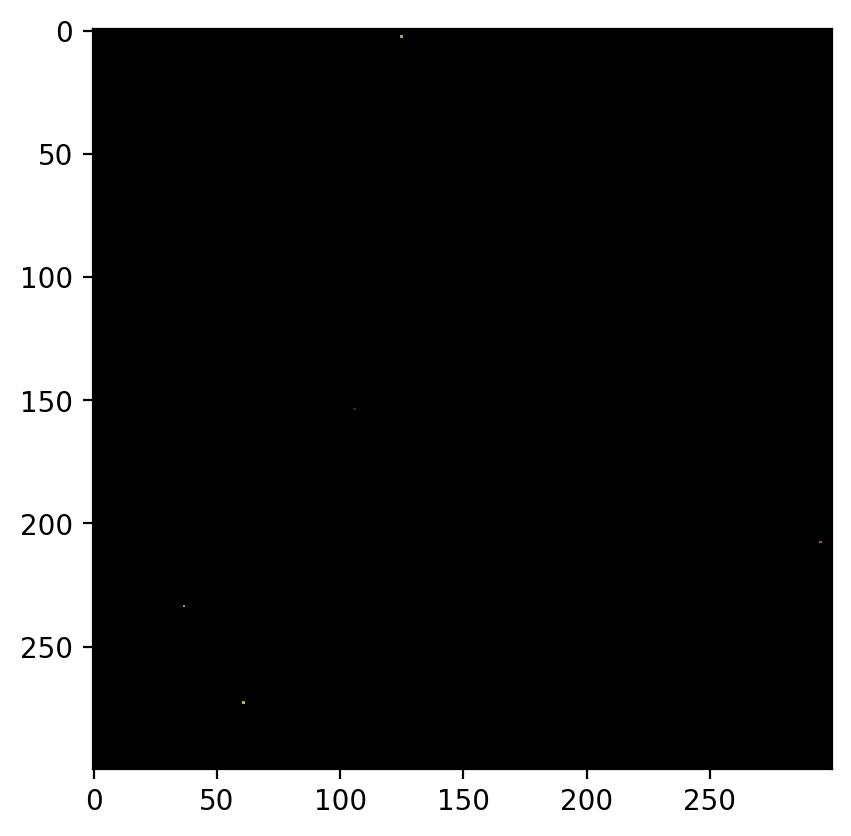

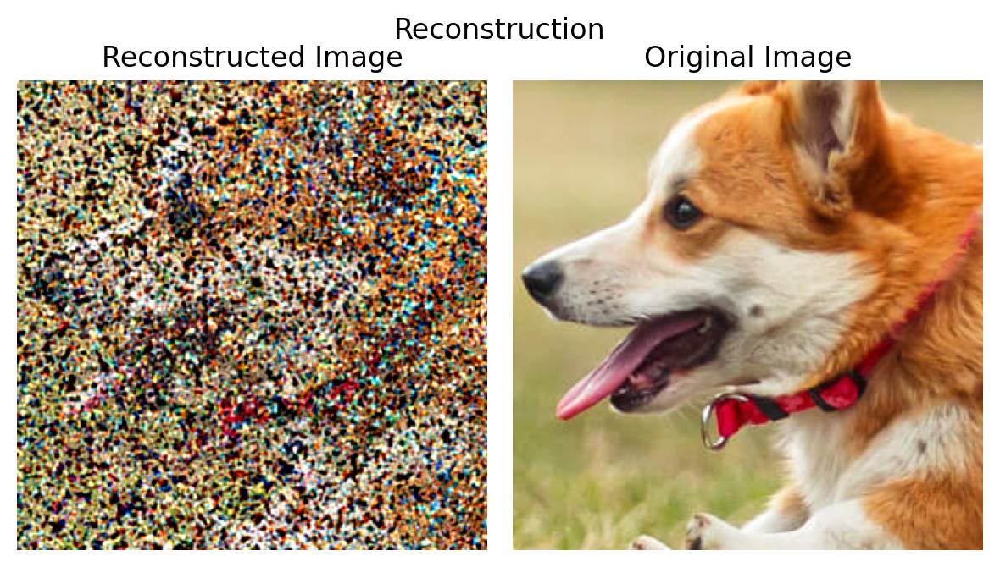

In [56]:
Findices = create_boolean_list(dog_Y.shape[0],90)
new_crop_90 = Show_removed_pixel(crop, Findices)

dog_Y_90 = dog_Y[Findices , :]
X_rff_90 = X_rff[Findices , :]
print(dog_Y_90.shape)
print(X_rff_90.shape)


model = LinearModel(X_rff_90.shape[1], dog_Y_90.shape[1])

model.to(device)

train(model, 0.005, X_rff_90, dog_Y_90, 2000)

output_y_90 =plot_reconstructed_and_original_image(crop , model ,X_rff ,title="Reconstruction" )


mse = ((output_y_90.cpu().numpy() - rearrange(crop , 'c h w -> h w c').cpu().numpy())**2).sum() / (crop.shape[0]* crop.shape[1]* crop.shape[2])

rmse = np.sqrt(mse)
rmse

MAX=1.0 # MAX represents the maximum possible pixel value of the image (e.g., 255 for an 8-bit grayscale image or 1 for a normalized image).

PSNR = 10 * np.log10((MAX ** 2) / mse)

print('RMSE:', rmse)
print('Peak SNR:' , PSNR)
rmse_loss.append(rmse)
peak_snr.append(PSNR)

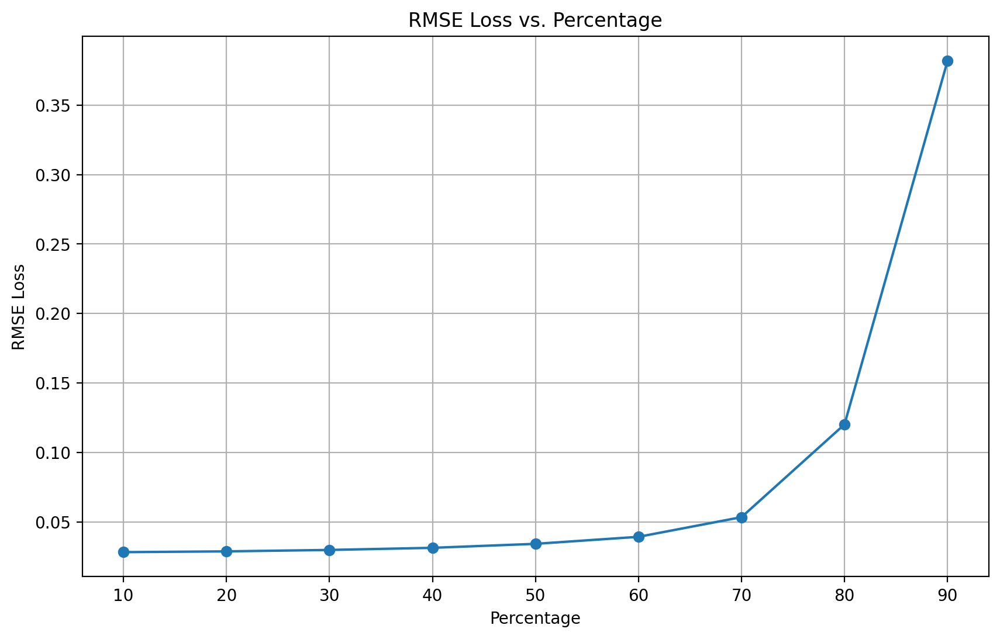

In [57]:
import matplotlib.pyplot as plt

X_values = list(range(10, 100, 10))

plt.figure(figsize=(10, 6))
plt.plot(X_values, rmse_loss, marker='o')
plt.title('RMSE Loss vs. Percentage')
plt.xlabel('Percentage')
plt.ylabel('RMSE Loss')
plt.grid(True)
plt.show()

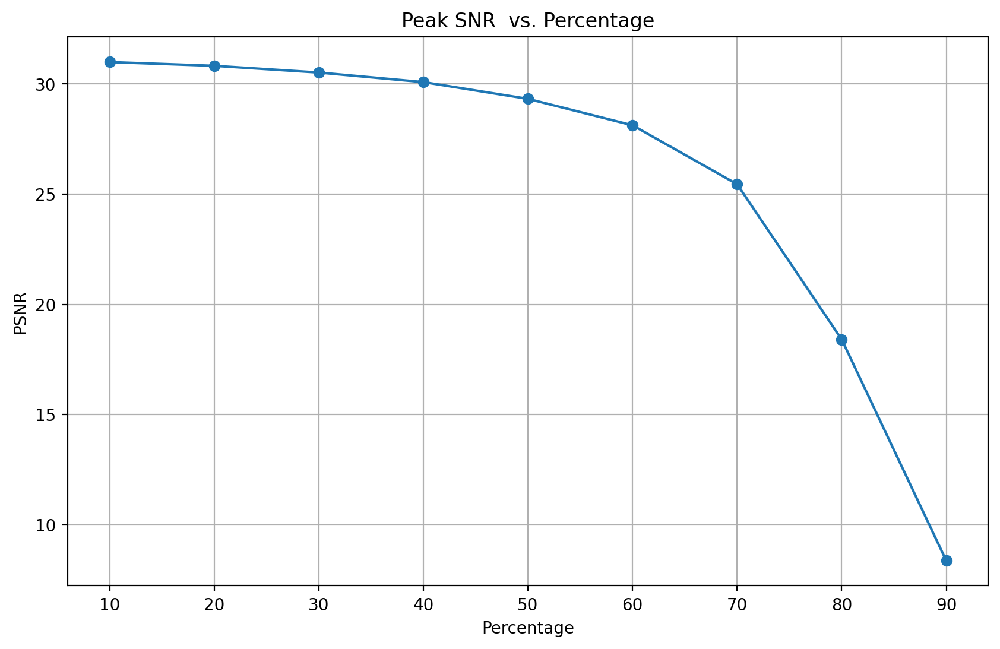

In [59]:
plt.figure(figsize=(10, 6))
plt.plot(X_values, peak_snr, marker='o')
plt.title('Peak SNR  vs. Percentage')
plt.xlabel('Percentage')
plt.ylabel('PSNR')
plt.grid(True)
plt.show()

# **Conclusion**

When reconstructing an image and observing the Root Mean Square Error (RMSE) and Peak Signal-to-Noise Ratio (PSNR) after removing a certain percentage of the data, we notice a particular trend. Initially, as we remove a small percentage of the data, the reconstructed image closely resembles the original image, and both the RMSE and PSNR metrics reflect this closeness.

As we continue to remove data, we observe that the RMSE and PSNR values maintain relatively stable trends. However, upon reaching around 50% of data loss, we start noticing a significant change in the behavior of these metrics.

Specifically, beyond 50% data loss, the noise present in the reconstructed image becomes more apparent. As a result, the RMSE begins to increase rapidly, indicating a larger deviation between the reconstructed image and the original image.

Consequently, the PSNR, which measures the ratio of the maximum possible signal to the noise introduced by the reconstruction process, starts to decrease sharply after the 50% threshold. This decrease in PSNR reflects the increased noise in the reconstructed image compared to the original image.

From our observations, we can infer that up to 50% data loss, the reconstruction process manages to maintain a relatively faithful representation of the original image. However, beyond this threshold, the noise introduced by the reconstruction process becomes more prominent, leading to a rapid deterioration in the image quality as indicated by both the RMSE and PSNR metrics.